# ECS7020P mini-project advanced



# 1 Author

**Student Name**: Eleanor Prashamshini  
**Student ID**: 220772291 



# 2 Problem formulation

Consider a scenario, a person needs urgent care and calls the emergency service. However, due to their ill state, such as feeling faint or incoherence in understanding situation, they are unable to communicate their location to the helpline operator. To track this person's location, the operator could use -
1. GPS tracking, but due to privacy concerns it is sometimes difficult to obtain this.
2. Locate the reception tower that connected the call, but calls sometimes do not connect to the nearest tower, making it difficult to rely on.

Using the MLEnd London Sounds corpus and information about their recording locations, can we build a machine learning model that predicts the location of an audio clip?

# 3 Machine Learning pipeline

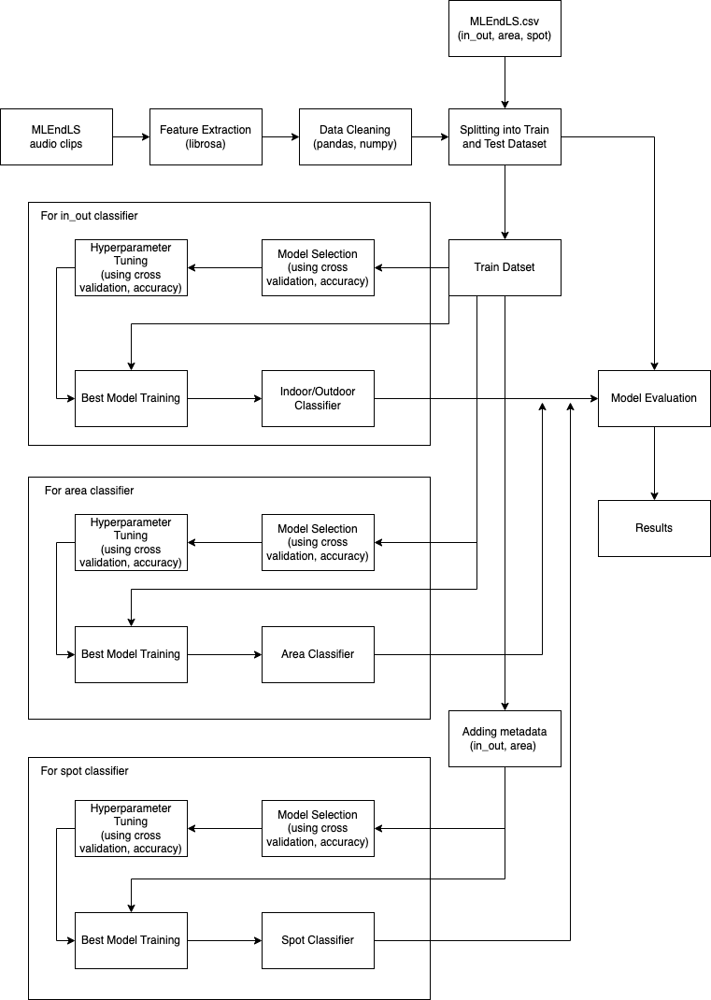 


Input - Audio files and Labels

Feature Extraction - converting audio files into frequency, power and other interpretable features

Data Cleaning - removing broken files, and other unsuitable values

Feature selection - removing columns with high correlation

Model Validation - Selecting a family of models that suits our use case

Model Tuning - Finding hyper parameters best suited

Training - Training our classifier

Testing - Evaluating the classifier performance

In [114]:
# Imports
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa, librosa.display

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

In [2]:
# Accessing Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


# 4 Transformation stage

A sound segment is rich in data. However, providing all the signal data points as input to the machine learning model would only confuse it because we do not have enough data to generalise the model training, this would result in the model overfitting the training dataset and poor performance on the test dataset. Instead, we can extract features of the audio signal that communicate essential characteristics of the audio.

In [3]:
# Viewing the list of files/directories in `path`
path = '/content/drive/MyDrive/Data/MLEndLS'
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS/'
dirs = os.listdir(path)
dirs

['sample',
 'MLEndLS_1.zip',
 'MLEndLS_2.zip',
 'MLEndLS_3.zip',
 'MLEndLS_4.zip',
 'MLEndLS_5.zip',
 'MLEndLS']

In [ ]:
# Unzipping all the zip files and consolidating all the audio files in a single folder
for f in dirs:
  # Checking if it is a *.zip file before extracting
  if re.search('.zip$', f) != None:
    zip_path = path+'/'+f
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(directory_to_extract_to)

In [4]:
# Checking the total number of audio files
audio_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS/*.wav'
files = glob.glob(audio_path)
files.sort() # order ascending by default
total_files = len(files)
total_files

2500

In [5]:
def load_audio(file_no, fs=22050, display_audio=False):
  """
  Loading an audio file based on file number and 
  providing an audio component to play the clip

  Input:
  file_no - file number to be loaded
  fs - frequency of sampling per second; default 22050
  display_audio - set True to display audio component; default False

  Output:
  x - sample points
  fs - frequency of sampling per second
  """
  
  global files
  
  n = file_no - 1 # n is index

  if n > len(files) or n < 0:
    print("Invalid file number")
    return 0, 0

  # Loading audio file
  x, _ = librosa.load(files[n], sr=fs)
  print(files[n], ': audio signal has', len(x), 'samples')
  
  if display_audio == True:
    # Display component for listening to audio
    display(ipd.Audio(files[n]))
  
  return x, fs

In [10]:
# Testing
file_no_test = 1
x_test, fs = load_audio(file_no_test, display_audio=True)
print(fs)

/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0001.wav : audio signal has 211460 samples


22050


In [6]:
def load_audio_by_name(file_name, fs=22050, display_audio=False):
  """
  Loading an audio file based on file name and 
  providing an audio component to play the clip

  Input:
  file_name - name of the file to be loaded
  fs - frequency of sampling per second; default 22050
  display_audio - set True to display audio component; default False

  Output:
  x - sample points
  fs - frequency of sampling per second
  """

  global files, directory_to_extract_to
  
  complete_path = directory_to_extract_to + file_name
  file_no = files.index(complete_path) + 1 
  
  return load_audio(file_no, fs, display_audio)

In [ ]:
# Testing
file_name_test = '0001.wav' 
x_test, fs = load_audio_by_name(file_name_test, display_audio=True)
print(fs)

/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0001.wav : audio signal has 211460 samples


22050


Every audio file contains a segment at the beginning where the recorder says "This is London." We want to try and separate this speech marker from the rest of the audio clip. Using the `librosa.pyin` function we can identify the voice segements and their pitch, however separating only the introduction (intro) from the rest of the voices is difficult. 

Taking a random sample of 25 audio clips from the corpus and manually scanning them, here are some observations:


In [132]:
np.random.seed(1) # setting seed for reproducing results

# Sampling 25 random files from the entire collection
samples_25 = np.random.randint(1, 2500, size=(25))
for i in samples_25:
  load_audio(i, display_audio=False) # set to true to view here

samples_25

/content/drive/MyDrive/Data/MLEndLS/MLEndLS/1062.wav : audio signal has 145971 samples
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0236.wav : audio signal has 170447 samples
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/1097.wav : audio signal has 182133 samples
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0906.wav : audio signal has 406602 samples
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0961.wav : audio signal has 165375 samples
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0145.wav : audio signal has 233730 samples
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0130.wav : audio signal has 161186 samples
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/1203.wav : audio signal has 166698 samples
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/1301.wav : audio signal has 176621 samples
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/1279.wav : audio signal has 155232 samples
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0358.wav : audio signal has 225351 samples
/content/drive/MyDrive/Data/MLEndLS/MLEndLS

array([1062,  236, 1097,  906,  961,  145,  130, 1203, 1301, 1279,  358,
        253,  669, 2447,  563,  754, 1528, 1889, 1111, 2190, 2026, 1032,
        320, 1338, 1921])

In [7]:
# Observations of intro end (roughly)
obs_samples_25 = [3, 2, 1, 1, 1, 
                  2, 1, 0, 1, 2, 
                  2, 1, 0, 2, 1, 
                  3, 1, 2, 1, 2, 
                  2, 2, 1, 3, 1]
print('Observed end of intro:', obs_samples_25)
print('min:', np.min(obs_samples_25), 'sec \nmax:', np.max(obs_samples_25), 'sec')
print('mean:', np.mean(obs_samples_25), 'sec \nstd:', np.std(obs_samples_25))

Observed end of intro: [3, 2, 1, 1, 1, 2, 1, 0, 1, 2, 2, 1, 0, 2, 1, 3, 1, 2, 1, 2, 2, 2, 1, 3, 1]
min: 0 sec 
max: 3 sec
mean: 1.52 sec 
std: 0.8059776671843953


Using the above max and mean we define conditions for identifying the the speech marker if it is distinguishable by pitch from the rest of the audio.

Using the **sampled audio clip as input**, the voice features extracted are:
1. **Voice Fraction** - fraction of speech in the clip
2. **Pitch** (mean and standard deviation) - the human perception of voice in the intro
3. **Power** - the loudness of voice in the intro, calculated using the Root-Mean-Square energy

In [8]:
def getVoiceFeatures(x, fs=22050, winLen=0.05):
  """
  Calculate the overall voice fraction,
  extract the pitch and power of the intro and the end of speech marker

  Input:
  x - sample points
  fs - frequency of sampling per second; default 22050
  winLen - window length; default 0.05

  Output:
  voice_features - list of extracted features for the voice segment
  feature_names - list of extracted features
  speech_marker_end - ending index of intro
  """
  
  voice_features = [] # for the values
  feature_names = [] # for the names

  duration = len(x) / fs
  print('x:', len(x), 'fs:', fs, 'time', duration, 's')
  
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//4
  f0, voiced_flags, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs, 
                                                frame_length=frame_length,
                                                hop_length=hop_length)
  
  # Voice Fraction
  voiced_fr = np.mean(voiced_flags)
  voice_features.append(voiced_fr)
  feature_names.append('voiced_fr')
  
  this_is_london = [] # for the pitch of voice parts
  speech_marker_end = 0 # for index of intro end
  for i in range(len(f0)):
    # i lesser than 3 sec (max observed)
    if (voiced_flags[i] == True) and (i < (3 * len(f0)/duration)):
      this_is_london.append(f0[i])
    
    # i lesser than 1.52 sec (mean observed)
    elif i > (1.52 * len(f0)/duration):
      # Calculate the end marker in the actual x
      speech_marker_end = round((i + 1) * (len(x) / len(f0)))
      break

  # Power of intro voice segment
  intro_stft = librosa.stft(x[:speech_marker_end]) # short-term Fourier transform
  S, phase = librosa.magphase(intro_stft)
  intro_rms = librosa.feature.rms(S=S)
  intro_power = np.sum(intro_rms**2)/len(intro_rms)
  voice_features.append(intro_power)
  feature_names.append('intro_power')

  # Pitch mean and std
  intro_pitch_mean = np.mean(this_is_london)
  voice_features.append(intro_pitch_mean)
  feature_names.append('intro_pitch_mean')
  intro_pitch_std = np.std(this_is_london)
  voice_features.append(intro_pitch_std)
  feature_names.append('intro_pitch_std')

  return voice_features, feature_names, speech_marker_end

In [11]:
# Testing
vf_test, vfn_test, end_test = getVoiceFeatures(x_test, fs)
print('No. of intro features:', len(vf_test))
print('List of features:', vfn_test)
print('Feature values:', vf_test)

x: 211460 fs: 22050 time 9.59002267573696 s
No. of intro features: 4
List of features: ['voiced_fr', 'intro_power', 'intro_pitch_mean', 'intro_pitch_std']
Feature values: [0.34299516908212563, 0.08466846756346058, 82.53833719399108, 5.440150054301729]


The clips record the all sounds in a location, such as people talking, music, rushing water and many other sounds. We need to extract features that can  characterise the all varieties of sounds.

The sound features extracted by providing the **sampled audio clip as input**:
1. **Power** - the overall loudness of the clip, calculated using the Root-Mean-Square energy
2. **Tempo** - speed, measured in beats per minute and averaged across the entire clip
3. **Zero crossing** (count, rate mean and rate std) - changing of signal from positive to negative and vice versa
4. **Chroma** (mean and std for every scale) - characterises the pitch on the 12 scales (C, C♯, D, D♯, E, F, F♯, G, G♯, A, A♯, B) and can be visualised in a chromagram
5. **Mel Frequency Cepstral Coefficients** (mean and std for each coeff) - uses the mel scale, which characterise distance in pitch to distance from listener. Based on the number of coefficients, the audio is passed through that many filters and we get heatmap of the audio clip modelling frequency against time.
6. **First and second derivative of MFCC** (mean and std for each coeff) - this is calculated to observe the change of the above coefficients over time.

In [12]:
def getSoundFeatures(x, fs=22050, winLen=0.05):
  """
  Extract power, Tempo, ZCR, Chromagram and
  MFCC (including delta order 1 and 2)

  Input:
  x - sample points
  fs - frequency of sampling per second; default 22050
  winLen - window length; default 0.05

  Output:
  sound_features - list of extracted features for the clip passed
  feature_names - list of extracted features
  """

  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//4

  duration = len(x) / fs
  sound_features = []
  feature_names = []

  # Power
  X_stft = librosa.stft(x) # short-term Fourier transform
  S, phase = librosa.magphase(X_stft)
  X_rms = librosa.feature.rms(S=S)
  X_power = np.sum(x**2)/len(x)
  sound_features.append(X_power) # sound_features[0]
  feature_names.append('power')

  # Tempo
  X_oenv = librosa.onset.onset_strength(y=x, sr=fs, hop_length=hop_length)
  X_tempo = librosa.beat.tempo(onset_envelope=X_oenv, sr=fs, 
                               hop_length=hop_length)[0]
  sound_features.append(X_tempo) # sound_features[1]
  feature_names.append('tempo')

  # Zero Crossing count and rate
  zc_count = sum(librosa.zero_crossings(x))
  zc_mean = zc_count/duration
  sound_features.append(zc_mean) # sound_features[2]
  feature_names.append('zc_mean')
  X_zcr = librosa.feature.zero_crossing_rate(x)
  zcr_mean = np.mean(X_zcr.T, axis = 0)
  sound_features.extend(zcr_mean) # sound_features[3]
  feature_names.append('zcr_mean')
  zcr_std = np.std(X_zcr.T, axis = 0)
  sound_features.extend(zcr_std) # sound_features[4]
  feature_names.append('zcr_std')

  # Chromagram (24 features)
  X_chromagram = librosa.feature.chroma_stft(x, sr=fs, hop_length=hop_length)
  chroma_mean = np.mean(X_chromagram.T, axis=0)
  sound_features.extend(chroma_mean) # sound_features[5:17]
  feature_names.extend(['chroma_mean_'+str(i) for i in range(1, len(chroma_mean)+1)])
  chroma_std = np.std(X_chromagram.T, axis=0)
  sound_features.extend(chroma_std) # sound_features[17:29]
  feature_names.extend(['chroma_std_'+str(i) for i in range(1, len(chroma_std)+1)])

  # MFCC (26 features)
  X_mfcc = librosa.feature.mfcc(x, sr=fs, n_mfcc=13) # n_mfcc=20 by default
  mfcc_mean = np.mean(X_mfcc.T, axis=0)
  sound_features.extend(mfcc_mean) # sound_features[29:42]
  feature_names.extend(['mfcc_mean_'+str(i) for i in range(1, len(mfcc_mean)+1)])
  mfcc_std = np.std(X_mfcc.T, axis=0)
  sound_features.extend(mfcc_std) # sound_features[42:55]
  feature_names.extend(['mfcc_std_'+str(i) for i in range(1, len(mfcc_std)+1)])
  
  # Delta MFCC order 1 (26 features)
  X_d_mfcc = librosa.feature.delta(X_mfcc)
  d_mfcc_mean = np.mean(X_d_mfcc.T, axis=0)
  sound_features.extend(d_mfcc_mean) # sound_features[55:68]
  feature_names.extend(['d_mfcc_mean_'+str(i) for i in range(1, len(d_mfcc_mean)+1)])
  d_mfcc_std = np.std(X_d_mfcc.T, axis=0)
  sound_features.extend(d_mfcc_std) # sound_features[68:81]
  feature_names.extend(['d_mfcc_std_'+str(i) for i in range(1, len(d_mfcc_std)+1)])

  # Delta MFCC order 2  (26 features)
  X_d2_mfcc = librosa.feature.delta(X_mfcc, order=2)
  d2_mfcc_mean = np.mean(X_d2_mfcc.T, axis=0)
  sound_features.extend(d2_mfcc_mean) # sound_features[81:94]
  feature_names.extend(['d2_mfcc_mean_'+str(i) for i in range(1, len(d2_mfcc_mean)+1)])
  d2_mfcc_std = np.std(X_d2_mfcc.T, axis=0)
  sound_features.extend(d2_mfcc_std) # sound_features[94:]
  feature_names.extend(['d2_mfcc_std_'+str(i) for i in range(1, len(d2_mfcc_std)+1)])

  # total sound features is 107

  return sound_features, feature_names

In [ ]:
# Testing
sf_test, sfn_test = getSoundFeatures(x_test[end_test:], fs)
print('No. of sound features:', len(sf_test))
print('List of features:', sfn_test)
print('Feature values:', sf_test)

No. of sound features: 107
List of features: ['power', 'tempo', 'zc_mean', 'zcr_mean', 'zcr_std', 'chroma_mean_1', 'chroma_mean_2', 'chroma_mean_3', 'chroma_mean_4', 'chroma_mean_5', 'chroma_mean_6', 'chroma_mean_7', 'chroma_mean_8', 'chroma_mean_9', 'chroma_mean_10', 'chroma_mean_11', 'chroma_mean_12', 'chroma_std_1', 'chroma_std_2', 'chroma_std_3', 'chroma_std_4', 'chroma_std_5', 'chroma_std_6', 'chroma_std_7', 'chroma_std_8', 'chroma_std_9', 'chroma_std_10', 'chroma_std_11', 'chroma_std_12', 'mfcc_mean_1', 'mfcc_mean_2', 'mfcc_mean_3', 'mfcc_mean_4', 'mfcc_mean_5', 'mfcc_mean_6', 'mfcc_mean_7', 'mfcc_mean_8', 'mfcc_mean_9', 'mfcc_mean_10', 'mfcc_mean_11', 'mfcc_mean_12', 'mfcc_mean_13', 'mfcc_std_1', 'mfcc_std_2', 'mfcc_std_3', 'mfcc_std_4', 'mfcc_std_5', 'mfcc_std_6', 'mfcc_std_7', 'mfcc_std_8', 'mfcc_std_9', 'mfcc_std_10', 'mfcc_std_11', 'mfcc_std_12', 'mfcc_std_13', 'd_mfcc_mean_1', 'd_mfcc_mean_2', 'd_mfcc_mean_3', 'd_mfcc_mean_4', 'd_mfcc_mean_5', 'd_mfcc_mean_6', 'd_mfcc_mean_

**The total number of features extracted from an audio clip is 111.**

# 5 Modelling

Our goal is to predict if an audio clip is one of the locations in MLEndLS dataset. Given the `MLEndLS.csv`, using the `in_out`, `area` and `spot` columns and extracted features from the audio files, we can create a labelled training datasets and use **supervised machine learning classifiers** to achieve our goal. 

## Indoor/Outdoor classifier

We have previously (basic problem) identified Logistic Regression classifier as a well suited model to classify samples and will be using the same here. 

## Area classifier and Spot classifier

Since we have multiple areas and even more number of spots, instead of validating different models we will explore two ensemble methods -
1. Random Forest Classifier - randomly selects samples and features to generates multiple decision trees, and takes a majority of the outcomes as the result. It is robust to overfitting.
2. Adaptive Boosting Classifier - it uses weak classifiers such as one level decision trees iteratively on modified data, and predictions from all is combined through weighted majority.


In [14]:
family_models = [ RandomForestClassifier(),
                 AdaBoostClassifier()]

# 6 Methodology

## Model training and testing

First we divide the dataset into training and test datasets - 80:20 (Pareto principle). 

Using the training dataset and k-fold cross validation we will -
1. validate families of models with default parameters and select the high performing models
2. perform hyperparameter tuning for the selected models and pick one model

Once we have the model and its hyperparameters are decided we will  fit it with the training dataset. This is our final model and will be evaluated with the test dataset.

## Evaluation Metrics

We will be using accuracy (A) to compare the performance of different models, as it gives a measure of the correctly classified samples overall. 

A = (TP + TN) / Total Count 

Since we will be using k-fold cross validation, accuracy is determined as the mean accuracy across all folds. Additionally, it is important to note the standard devation across the folds, as it tells us about the stability of our performance metric.


To evaluate the final models performance on the test set we will be using accuracy, F1-score and confusion matrix. 

F1-score (F1) - it combines precision and recall in a single metric and helps balance both. We need precision and recall to understand internal class performances. 

F1 = (2 x Precision x Recall) / (Precision + Recall)

Precision = TP / (TP + FP); Recall = TP / (TP + FN)

Confusion matrix - to get better visual understanding of class performances.

In [15]:
def cvFamilyOfModels(x, y, family_models, k=5, eval_metric='accuracy', scaler=False):
  """
  Using cross-validation method to evaluate families of models

  Input:
  x - dataset
  y - labels
  family_models - families of models
  k - number of folds in cross validation; default 5
  eval_metric - the metric used for evaluation; default 'accuracy'
  scaler - set to true if z-score normalisation needs to be performed; default False

  Output:
  model_scores - dict of models and their accuracy 
  """
  model_scores = {}
  
  if scaler == True:
    scaler = StandardScaler()
    scaler.fit(x)
    x1 = scaler.transform(x)
  else:
    x1 = x

  for model in family_models:
    model.fit(x1, y)
    kfold_cv = KFold(n_splits=k, random_state=1, shuffle=True)
    scores = cross_val_score(model, x1, y, scoring=eval_metric, cv=kfold_cv, n_jobs=-1)
    model_scores[type(model).__name__] = [np.mean(scores), np.std(scores)]

  return model_scores

In [16]:
def tuningModel(x, y, model, model_params, scaler=True):
  """
  Using Grid Search cross validation to find the best parameters for a model

  Input:
  x - dataset
  y - labels
  model - model to e tuned
  model_params - the parameters values for tuning
  scaler - set to true if z-score normalisation needs to be performed; default True

  Output:
  #TODO
  """
  if scaler == True:
    scaler = StandardScaler()
    scaler.fit(x)
    x1 = scaler.transform(x)
  else:
    x1 = x
  
  clf = GridSearchCV(model, model_params)
  clf.fit(x1, y)
  return pd.DataFrame.from_dict(clf.cv_results_)[['mean_fit_time', 'params', 
                                                  'mean_test_score', 'std_test_score',
                                                  'rank_test_score']]

# 7 Dataset

The MLEnd London Sounds dataset will be used in creating our model. The dataset, at this time of use (Dec 2022) consists of 2500 recordings from 36 locations around London. The participants contributing to this database are students in ECS7020: Principles of Machine Learning module, 2022 cohort. The database has been reviewed and consolidated by the module convenor, Jesus Requena-Carrion, and his team. They have additionally created a CSV file that captures metadata about the recordings - indoor/outdoor, area, spot and participant. 

We will only be using a subset of this dataset, that is areas - 'british', 'westend' and 'campus', as the rest of the areas do not have sufficient samples for training.

## 7.1 Feature Extraction

In [17]:
# Loading the MLEndLS.csv file with area, spot, in_out and participant info 
MLENDLS_df = pd.read_csv('./MLEndLS.csv').set_index('file_id') 
MLENDLS_df.shape

(2500, 4)

In [ ]:
audio_df = pd.DataFrame(columns=('voiced_fr', 'intro_power', 'intro_pitch_mean', 
                                 'intro_pitch_std', 'power', 'tempo', 'zc_mean', 
                                 'zcr_mean', 'zcr_std', 'chroma_mean_1', 
                                 'chroma_mean_2', 'chroma_mean_3', 'chroma_mean_4', 
                                 'chroma_mean_5', 'chroma_mean_6', 'chroma_mean_7', 
                                 'chroma_mean_8', 'chroma_mean_9', 'chroma_mean_10', 
                                 'chroma_mean_11', 'chroma_mean_12', 'chroma_std_1', 
                                 'chroma_std_2', 'chroma_std_3', 'chroma_std_4', 
                                 'chroma_std_5', 'chroma_std_6', 'chroma_std_7', 
                                 'chroma_std_8', 'chroma_std_9', 'chroma_std_10', 
                                 'chroma_std_11', 'chroma_std_12', 'mfcc_mean_1', 
                                 'mfcc_mean_2', 'mfcc_mean_3', 'mfcc_mean_4', 
                                 'mfcc_mean_5', 'mfcc_mean_6', 'mfcc_mean_7', 
                                 'mfcc_mean_8', 'mfcc_mean_9', 'mfcc_mean_10', 
                                 'mfcc_mean_11', 'mfcc_mean_12', 'mfcc_mean_13', 
                                 'mfcc_std_1', 'mfcc_std_2', 'mfcc_std_3', 
                                 'mfcc_std_4', 'mfcc_std_5', 'mfcc_std_6', 
                                 'mfcc_std_7', 'mfcc_std_8', 'mfcc_std_9', 
                                 'mfcc_std_10', 'mfcc_std_11', 'mfcc_std_12', 
                                 'mfcc_std_13', 'd_mfcc_mean_1', 'd_mfcc_mean_2', 
                                 'd_mfcc_mean_3', 'd_mfcc_mean_4', 'd_mfcc_mean_5', 
                                 'd_mfcc_mean_6', 'd_mfcc_mean_7', 'd_mfcc_mean_8', 
                                 'd_mfcc_mean_9', 'd_mfcc_mean_10', 'd_mfcc_mean_11', 
                                 'd_mfcc_mean_12', 'd_mfcc_mean_13', 'd_mfcc_std_1', 
                                 'd_mfcc_std_2', 'd_mfcc_std_3', 'd_mfcc_std_4', 
                                 'd_mfcc_std_5', 'd_mfcc_std_6', 'd_mfcc_std_7', 
                                 'd_mfcc_std_8', 'd_mfcc_std_9', 'd_mfcc_std_10', 
                                 'd_mfcc_std_11', 'd_mfcc_std_12', 'd_mfcc_std_13', 
                                 'd2_mfcc_mean_1', 'd2_mfcc_mean_2', 'd2_mfcc_mean_3', 
                                 'd2_mfcc_mean_4', 'd2_mfcc_mean_5', 'd2_mfcc_mean_6', 
                                 'd2_mfcc_mean_7', 'd2_mfcc_mean_8', 'd2_mfcc_mean_9', 
                                 'd2_mfcc_mean_10', 'd2_mfcc_mean_11', 'd2_mfcc_mean_12', 
                                 'd2_mfcc_mean_13', 'd2_mfcc_std_1', 'd2_mfcc_std_2', 
                                 'd2_mfcc_std_3', 'd2_mfcc_std_4', 'd2_mfcc_std_5', 
                                 'd2_mfcc_std_6', 'd2_mfcc_std_7', 'd2_mfcc_std_8', 
                                 'd2_mfcc_std_9', 'd2_mfcc_std_10', 'd2_mfcc_std_11', 
                                 'd2_mfcc_std_12', 'd2_mfcc_std_13'))

In [ ]:
ml_index = MLENDLS_df.index
for i in range(0, len(ml_index)): 
  f = ml_index[i] # file name
  
  # Load Audio
  x, fs = load_audio_by_name(f)
  
  # Extract Features
  vf, vfn, voice_end = getVoiceFeatures(x, fs)
  sf, sfn = getSoundFeatures(x[voice_end:], fs)
  
  # Initialise row in dataframe as NaN values
  audio_df.loc[f] = [np.NaN] * 111
  
  # Adding voice features
  for j in range(len(vfn)):
    audio_df[vfn[j]].loc[ml_index[i]] = vf[j]
  
  # Adding sound features
  for j in range(len(sfn)):
    audio_df[sfn[j]].loc[ml_index[i]] = sf[j]

print(audio_df.shape)
audio_df.head()

/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0001.wav : audio signal has 211460 samples
x: 211460 fs: 22050 time 9.59002267573696 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0002.wav : audio signal has 155232 samples
x: 155232 fs: 22050 time 7.04 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0003.wav : audio signal has 195143 samples
x: 195143 fs: 22050 time 8.85002267573696 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0004.wav : audio signal has 170226 samples
x: 170226 fs: 22050 time 7.72 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0005.wav : audio signal has 251811 samples
x: 251811 fs: 22050 time 11.42 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0006.wav : audio signal has 183236 samples
x: 183236 fs: 22050 time 8.310022675736962 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0007.wav : audio signal has 168903 samples
x: 168903 fs: 22050 time 7.66 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0008.wav : audio signal has 158760 samples
x: 158760 fs: 22050 time 7.2 s
/content/dr

/usr/local/lib/python3.8/dist-packages/librosa/core/pitch.py:153: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn("Trying to estimate tuning from empty frequency set.")


/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0034.wav : audio signal has 199553 samples
x: 199553 fs: 22050 time 9.050022675736962 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0035.wav : audio signal has 170226 samples
x: 170226 fs: 22050 time 7.72 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0036.wav : audio signal has 160304 samples
x: 160304 fs: 22050 time 7.2700226757369615 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0037.wav : audio signal has 186984 samples
x: 186984 fs: 22050 time 8.48 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0038.wav : audio signal has 181692 samples
x: 181692 fs: 22050 time 8.24 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0039.wav : audio signal has 321048 samples
x: 321048 fs: 22050 time 14.56 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0040.wav : audio signal has 176400 samples
x: 176400 fs: 22050 time 8.0 s
/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0041.wav : audio signal has 177723 samples
x: 177723 fs: 22050 time 8.06 s
/content/drive/MyDriv

,voiced_fr,intro_power,intro_pitch_mean,intro_pitch_std,power,tempo,zc_mean,zcr_mean,zcr_std,chroma_mean_1,...,d2_mfcc_std_4,d2_mfcc_std_5,d2_mfcc_std_6,d2_mfcc_std_7,d2_mfcc_std_8,d2_mfcc_std_9,d2_mfcc_std_10,d2_mfcc_std_11,d2_mfcc_std_12,d2_mfcc_std_13
0001.wav,0.342995,0.084668,82.538337,5.44015,0.002516,129.199219,1708.495291,0.077138,0.018879,0.752338,...,0.540176,0.56826,0.528627,0.680296,0.706554,0.725464,0.680416,0.699697,0.49298,0.515309
0002.wav,0.128289,0.498416,198.186625,35.035034,0.002227,117.453835,1453.784085,0.065541,0.010161,0.51903,...,0.778749,0.644343,0.614735,0.541634,0.582488,0.595942,0.702869,0.629596,0.536523,0.61177
0003.wav,0.089005,0.012391,NaN,NaN,0.000301,123.046875,2104.33922,0.094995,0.034198,0.701356,...,0.793043,0.725128,0.657387,0.630589,0.725458,0.657234,0.609637,0.686584,0.799412,0.675353
0004.wav,0.156156,0.282871,128.603121,18.052525,0.003755,123.046875,1945.406295,0.087749,0.010013,0.492492,...,0.62553,0.48478,0.603772,0.558154,0.569456,0.546609,0.512643,0.51785,0.485751,0.526345
0005.wav,0.097561,0.085971,158.122512,25.806473,0.000339,123.046875,2070.005302,0.09364,0.022253,0.634853,...,0.66293,0.587565,0.497692,0.514086,0.533742,0.528795,0.559469,0.478185,0.49986,0.453266


In [ ]:
# Copying features to csv file because it takes almost 90 minutes to execute the above cell
audio_df.index.name = 'file_id'
audio_df.to_csv('audio_features.csv')

## 7.2 Data Cleaning

In [18]:
# You can run this cell to import the extracted audio features
audio_df = pd.read_csv('./audio_features.csv').set_index('file_id')
audio_df.head()

,voiced_fr,intro_power,intro_pitch_mean,intro_pitch_std,power,tempo,zc_mean,zcr_mean,zcr_std,chroma_mean_1,...,d2_mfcc_std_4,d2_mfcc_std_5,d2_mfcc_std_6,d2_mfcc_std_7,d2_mfcc_std_8,d2_mfcc_std_9,d2_mfcc_std_10,d2_mfcc_std_11,d2_mfcc_std_12,d2_mfcc_std_13
file_id,,,,,,,,,,,,,,,,,,,,,
0001.wav,0.342995,0.084668,82.538337,5.440150,0.002516,129.199219,1708.495291,0.077138,0.018879,0.752338,...,0.540176,0.568260,0.528627,0.680296,0.706554,0.725464,0.680416,0.699697,0.492980,0.515309
0002.wav,0.128289,0.498416,198.186625,35.035034,0.002227,117.453835,1453.784085,0.065541,0.010161,0.519030,...,0.778749,0.644343,0.614735,0.541634,0.582488,0.595942,0.702870,0.629596,0.536523,0.611770
0003.wav,0.089005,0.012391,NaN,NaN,0.000301,123.046875,2104.339220,0.094995,0.034198,0.701356,...,0.793043,0.725128,0.657387,0.630589,0.725458,0.657234,0.609637,0.686584,0.799412,0.675353
0004.wav,0.156156,0.282871,128.603121,18.052525,0.003755,123.046875,1945.406295,0.087749,0.010013,0.492492,...,0.625530,0.484780,0.603772,0.558154,0.569456,0.546609,0.512643,0.517850,0.485751,0.526345
0005.wav,0.097561,0.085971,158.122512,25.806473,0.000339,123.046875,2070.005302,0.093640,0.022253,0.634853,...,0.662930,0.587565,0.497692,0.514086,0.533742,0.528795,0.559469,0.478185,0.499860,0.453266


It can observe that there are some NaN values in the data. We can first identify the list of columns with such values.

In [19]:
# Checking for any empty or NaN values
print('Count of missing values:')
for col in audio_df.columns:
  c = audio_df[col].isna().sum()
  if c > 0:
    print(col, c)

Count of missing values:
intro_pitch_mean 705
intro_pitch_std 705


The missing values is observed in records where 
*  the pitch of the intro cannot be distinctly identified by the library function or
*  the intro is said much later in the audio (after 1.52 sec)

We will be **substituting the NaN values with 0**.

In [20]:
# Replacing all the NaN values with zero
audio_df.fillna(0, inplace=True)
audio_df.head(10)

,voiced_fr,intro_power,intro_pitch_mean,intro_pitch_std,power,tempo,zc_mean,zcr_mean,zcr_std,chroma_mean_1,...,d2_mfcc_std_4,d2_mfcc_std_5,d2_mfcc_std_6,d2_mfcc_std_7,d2_mfcc_std_8,d2_mfcc_std_9,d2_mfcc_std_10,d2_mfcc_std_11,d2_mfcc_std_12,d2_mfcc_std_13
file_id,,,,,,,,,,,,,,,,,,,,,
0001.wav,0.342995,0.084668,82.538337,5.440150,0.002516,129.199219,1708.495291,0.077138,0.018879,0.752338,...,0.540176,0.568260,0.528627,0.680296,0.706554,0.725464,0.680416,0.699697,0.492980,0.515309
0002.wav,0.128289,0.498416,198.186625,35.035034,0.002227,117.453835,1453.784085,0.065541,0.010161,0.519030,...,0.778749,0.644343,0.614735,0.541634,0.582488,0.595942,0.702870,0.629596,0.536523,0.611770
0003.wav,0.089005,0.012391,0.000000,0.000000,0.000301,123.046875,2104.339220,0.094995,0.034198,0.701356,...,0.793043,0.725128,0.657387,0.630589,0.725458,0.657234,0.609637,0.686584,0.799412,0.675353
0004.wav,0.156156,0.282871,128.603121,18.052525,0.003755,123.046875,1945.406295,0.087749,0.010013,0.492492,...,0.625530,0.484780,0.603772,0.558154,0.569456,0.546609,0.512643,0.517850,0.485751,0.526345
0005.wav,0.097561,0.085971,158.122512,25.806473,0.000339,123.046875,2070.005302,0.093640,0.022253,0.634853,...,0.662930,0.587565,0.497692,0.514086,0.533742,0.528795,0.559469,0.478185,0.499860,0.453266
0006.wav,0.100559,0.190736,0.000000,0.000000,0.001682,123.046875,1587.763440,0.071584,0.029763,0.572484,...,1.281898,1.016686,1.026272,0.846875,0.879871,0.781878,0.834117,0.913975,0.672088,0.597660
0007.wav,0.193939,0.215039,136.478029,22.705797,0.003940,117.453835,1063.768552,0.048056,0.008897,0.477284,...,0.818917,0.955932,0.706403,0.641498,0.634031,0.740384,0.548908,0.439068,0.452791,0.643943
0008.wav,0.247588,0.015445,85.933402,6.898843,0.001972,123.046875,2801.789929,0.126331,0.036268,0.507377,...,0.547094,0.641638,0.577273,0.502361,0.590330,0.549302,0.605591,0.656920,0.574818,0.544373
0009.wav,0.109091,0.086365,226.137395,29.456722,0.000337,117.453835,1619.467980,0.073169,0.016660,0.471313,...,0.870391,0.948830,0.951711,0.731951,0.730781,0.715410,0.589417,0.604756,0.692286,0.589100


To ensure that all the files have been processed properly, we can check the zero crossing count, where if it is observed to be zero then we can assume the audio file is broken. 
**We will be dropping broken records from the dataset**.

In [21]:
# Identifying any broken audio files
weird_audio_files = []
for i in audio_df.index:
  if round(audio_df['zc_mean'][i]) == 0:
    weird_audio_files.append(i)

print(weird_audio_files)

['0033.wav', '2206.wav']


In [22]:
# Dropping the indexes in both dataframes
audio_df.drop(weird_audio_files, axis=0, inplace=True)
print('Features shape:', audio_df.shape)
MLENDLS_df.drop(weird_audio_files, axis=0, inplace=True)
print('Labels shape:', MLENDLS_df.shape)

Features shape: (2498, 111)
Labels shape: (2498, 4)


In [23]:
# Summarising information from the MLENDLS_df
participant = {}
area = {}
in_out = {'indoor': 0, 'outdoor': 0}

for index, record in MLENDLS_df.iterrows():
  # indoor / outdoor count
  in_out[record['in_out']] += 1

  # participants
  if record['Participant'] not in participant.keys():
    participant[record['Participant']] = 1
  else:
    participant[record['Participant']] += 1

  in_out_spot = str(record['in_out']+'_'+record['spot'])

  # areas and spots
  if record['area'] not in area.keys():
    area[record['area']] = {
        'total_count': 1, 
        in_out_spot: 1}
  else:
    area[record['area']]['total_count'] += 1
    if in_out_spot not in area[record['area']].keys():
      area[record['area']][in_out_spot] = 1
    else:
      area[record['area']][in_out_spot] += 1

print(in_out)
print(participant)

{'indoor': 1181, 'outdoor': 1317}
{'S151': 15, 'S127': 15, 'S18': 14, 'S179': 18, 'S176': 16, 'S89': 14, 'S140': 17, 'S20': 10, 'S131': 13, 'S69': 15, 'S39': 16, 'S136': 14, 'S66': 17, 'S145': 16, 'S99': 16, 'S137': 13, 'S73': 10, 'S55': 14, 'S82': 15, 'S105': 17, 'S181': 15, 'S3': 15, 'S101': 15, 'S41': 11, 'S52': 15, 'S157': 15, 'S143': 18, 'S162': 9, 'S115': 14, 'S72': 16, 'S144': 16, 'S27': 16, 'S111': 10, 'S49': 17, 'S126': 15, 'S59': 16, 'S12': 18, 'S57': 16, 'S67': 13, 'S58': 17, 'S60': 14, 'S48': 14, 'S150': 15, 'S117': 9, 'S164': 16, 'S13': 15, 'S56': 16, 'S94': 16, 'S29': 15, 'S116': 2, 'S36': 15, 'S81': 14, 'S166': 13, 'S107': 16, 'S68': 8, 'S65': 14, 'S54': 17, 'S71': 15, 'S148': 15, 'S170': 15, 'S87': 16, 'S35': 16, 'S189': 10, 'S50': 13, 'S17': 13, 'S90': 16, 'S124': 16, 'S9': 11, 'S92': 14, 'S1': 17, 'S177': 18, 'S62': 14, 'S167': 16, 'S183': 14, 'S190': 16, 'S133': 15, 'S110': 14, 'S43': 16, 'S31': 15, 'S51': 16, 'S152': 17, 'S75': 14, 'S193': 14, 'S25': 13, 'S40': 16, 

In [27]:
print(area)

{'british': {'total_count': 404, 'outdoor_street': 77, 'outdoor_forecourt': 82, 'indoor_greatcourt': 84, 'indoor_room12': 83, 'outdoor_square': 77, 'indoor_room13': 1}, 'kensington': {'total_count': 143, 'indoor_dinosaur': 25, 'indoor_hintze': 26, 'indoor_marine': 24, 'outdoor_albert': 26, 'outdoor_cromwell': 21, 'outdoor_pond': 21}, 'campus': {'total_count': 822, 'outdoor_square': 141, 'outdoor_canal': 137, 'indoor_reception': 136, 'outdoor_library': 133, 'indoor_ground': 139, 'indoor_curve': 136}, 'westend': {'total_count': 666, 'outdoor_piazza': 116, 'outdoor_leicester': 106, 'indoor_national': 110, 'indoor_market': 112, 'indoor_charing': 113, 'outdoor_trafalgar': 109}, 'Euston': {'total_count': 234, 'indoor_upper': 41, 'outdoor_piazza': 35, 'indoor_ritblat': 36, 'outdoor_forecourt': 40, 'indoor_library': 41, 'outdoor_gardens': 41}, 'southbank': {'total_count': 229, 'indoor_waterloo': 41, 'outdoor_skate': 40, 'outdoor_book': 36, 'outdoor_bridge': 40, 'outdoor_food': 39, 'indoor_roya

From the data collection phase we are aware of the list spots choosen in each area for recording, however 'room13' in the 'british' area is not present in the list and is possibly  incorrectly labelled. Since we need only the 'in_out' label but have no way of knowing if this label is correct, **we will be dropping the record associated with this spot**.

In [25]:
error_spot_index = MLENDLS_df[MLENDLS_df['spot'] == 'room13'].index
print(error_spot_index)

Index(['0762.wav'], dtype='object', name='file_id')


In [26]:
audio_df.drop(error_spot_index, axis=0, inplace=True)
print('Features shape:', audio_df.shape)
MLENDLS_df.drop(error_spot_index, axis=0, inplace=True)
print('Labels shape:', MLENDLS_df.shape)

Features shape: (2497, 111)
Labels shape: (2497, 4)


## 7.3 Selecting Dataset

In [28]:
area

{'british': {'total_count': 404,
  'outdoor_street': 77,
  'outdoor_forecourt': 82,
  'indoor_greatcourt': 84,
  'indoor_room12': 83,
  'outdoor_square': 77,
  'indoor_room13': 1},
 'kensington': {'total_count': 143,
  'indoor_dinosaur': 25,
  'indoor_hintze': 26,
  'indoor_marine': 24,
  'outdoor_albert': 26,
  'outdoor_cromwell': 21,
  'outdoor_pond': 21},
 'campus': {'total_count': 822,
  'outdoor_square': 141,
  'outdoor_canal': 137,
  'indoor_reception': 136,
  'outdoor_library': 133,
  'indoor_ground': 139,
  'indoor_curve': 136},
 'westend': {'total_count': 666,
  'outdoor_piazza': 116,
  'outdoor_leicester': 106,
  'indoor_national': 110,
  'indoor_market': 112,
  'indoor_charing': 113,
  'outdoor_trafalgar': 109},
 'Euston': {'total_count': 234,
  'indoor_upper': 41,
  'outdoor_piazza': 35,
  'indoor_ritblat': 36,
  'outdoor_forecourt': 40,
  'indoor_library': 41,
  'outdoor_gardens': 41},
 'southbank': {'total_count': 229,
  'indoor_waterloo': 41,
  'outdoor_skate': 40,
  'ou

We can observe here that the areas 'kensington', 'Euston' and 'southbank' have less data in comparison to the other three areas. This may lead to class imbalance and in some cases overfitting. Thus, we select a subset of the data including samples for - 'british', 'campus' and 'westend' areas.

In [29]:
subset_area = ['british', 'westend', 'campus']
area_subset_index = MLENDLS_df[~MLENDLS_df['area'].isin(subset_area)].index
area_subset_index

Index(['0002.wav', '0004.wav', '0007.wav', '0019.wav', '0024.wav', '0026.wav',
       '0031.wav', '0036.wav', '0038.wav', '0040.wav',
       ...
       '2450.wav', '2470.wav', '2478.wav', '2481.wav', '2482.wav', '2483.wav',
       '2485.wav', '2489.wav', '2490.wav', '2495.wav'],
      dtype='object', name='file_id', length=606)

In [30]:
audio_df.drop(area_subset_index, axis=0, inplace=True)
print('Features shape:', audio_df.shape)
MLENDLS_df.drop(area_subset_index, axis=0, inplace=True)
print('Labels shape:', MLENDLS_df.shape)

Features shape: (1891, 111)
Labels shape: (1891, 4)


## 7.3 Splitting Data - Train and Test Datasets

The data will be split into 20% test data and the rest as training data, based on the intuition from the Pareto principle.

In [47]:
X_train, X_test, y_train, y_test = train_test_split(audio_df, 
                                                    MLENDLS_df[['in_out','area','spot']], 
                                                    test_size = 0.2, 
                                                    random_state = 1)

print('Training:', X_train.shape, y_train.shape)
print('Testing:', X_test.shape, y_test.shape)

Training: (1512, 111) (1512, 3)
Testing: (379, 111) (379, 3)


In [48]:
X_train.head()

,voiced_fr,intro_power,intro_pitch_mean,intro_pitch_std,power,tempo,zc_mean,zcr_mean,zcr_std,chroma_mean_1,...,d2_mfcc_std_4,d2_mfcc_std_5,d2_mfcc_std_6,d2_mfcc_std_7,d2_mfcc_std_8,d2_mfcc_std_9,d2_mfcc_std_10,d2_mfcc_std_11,d2_mfcc_std_12,d2_mfcc_std_13
file_id,,,,,,,,,,,,,,,,,,,,,
0372.wav,0.190736,0.014941,239.999223,13.785683,0.000028,123.046875,694.855360,0.031338,0.008636,0.589783,...,0.785998,0.670702,0.858339,0.641403,0.675170,0.810873,0.742703,0.839954,0.728373,0.731217
0400.wav,0.128834,0.142621,233.259383,41.033314,0.001814,123.046875,1963.596309,0.088441,0.023167,0.459021,...,1.366292,1.189653,0.809153,1.060858,0.821058,0.629530,0.787633,0.815201,0.736093,0.828269
0725.wav,0.839394,0.101173,80.564814,1.387865,0.003553,123.046875,1431.728716,0.064631,0.014282,0.785070,...,0.668325,0.604619,0.562511,0.612902,0.645195,0.514691,0.529153,0.712235,0.537667,0.525292
2207.wav,0.034810,0.220427,225.794159,32.391456,0.004999,123.046875,6868.225789,0.310096,0.031426,0.642938,...,0.698447,0.610604,0.664437,0.634378,0.560761,0.583601,0.499739,0.613216,0.474026,0.522310
2339.wav,0.970238,0.050465,82.491321,4.143515,0.002871,129.199219,722.517483,0.032515,0.017754,0.489309,...,0.932916,0.804718,0.856742,0.812690,0.771764,0.779805,0.621488,0.803806,0.700788,0.680340


In [49]:
y_train.head()

,in_out,area,spot
file_id,,,
0372.wav,indoor,westend,national
0400.wav,outdoor,campus,library
0725.wav,outdoor,westend,trafalgar
2207.wav,outdoor,campus,canal
2339.wav,outdoor,westend,leicester


## 7.4 Data Visualisation

In [129]:
def visualise_audio(x, fs=22050, winLen=0.05, visuals=['amp', 'freq', 'energy']):
  """
  Visualising different features of an audio - amplitude ('amp'), 
  frequency spectogram ('freq'), mel-frequency cepstral coefficients ('mfcc'),
  chromagram ('chroma'), RMS energy ('energy') and beats ('tempo')

  Input:
  x - sample points
  fs - frequency of sampling per second; default 22050
  winLen - window length; default 0.05
  visuals - list of visualisations; default ['amp', 'freq', 'energy']

  Output:
  Displays graph(s)
  """

  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//4
  
  X_stft = librosa.stft(x) # short-term Fourier transform
  X_mfcc = librosa.feature.mfcc(x, sr=fs, n_mfcc=13) 

  if 'amp' in visuals:
    # Visualise Amplitude vs Time
    x_time = np.arange(0, len(x)) / fs
    plt.figure(figsize=(16, 4), dpi=50)
    plt.plot(x_time, x)
    plt.xlabel('Time(s)')
    plt.ylabel('Amplitude')
    plt.title('Amplitude vs Time')
    plt.show()

  if 'freq' in visuals:
    # Spectrogram of frequency
    X_db = librosa.amplitude_to_db(abs(X_stft))
    plt.figure(figsize=(16, 4), dpi=50)
    librosa.display.specshow(X_db, sr=fs, x_axis='time', y_axis='hz')
    plt.colorbar()
    plt.title('Frequency vs Time')
    plt.show()

  if 'mfcc' in visuals:
    # Mel-Frequency Cepstral Coefficients (MFCC)
    plt.figure(figsize=(16, 4), dpi=50)
    librosa.display.specshow(X_mfcc, sr=fs, x_axis='time')
    plt.colorbar()
    plt.title('Mel Frequency Cepstral Coefficients')
    plt.show()

  if 'd_mfcc' in visuals:
    # First derivative of MFCC
    X_d_mfcc = librosa.feature.delta(X_mfcc)
    plt.figure(figsize=(16, 4), dpi=50)
    librosa.display.specshow(X_d_mfcc, sr=fs, x_axis='time')
    plt.colorbar()
    plt.title('Delta MFCC (order = 1)')
    plt.show()

  if 'd2_mfcc' in visuals:
    # Second derivative of MFCC
    X_d2_mfcc = librosa.feature.delta(X_mfcc, order=2)
    plt.figure(figsize=(16, 4), dpi=50)
    librosa.display.specshow(X_d2_mfcc, sr=fs, x_axis='time')
    plt.colorbar()
    plt.title('Delta MFCC (order = 2)')
    plt.show()

  if 'chroma' in visuals:
    # Chromagram
    X_chromagram = librosa.feature.chroma_stft(x, sr=fs, hop_length=hop_length)
    plt.figure(figsize=(16, 4), dpi=50)
    librosa.display.specshow(X_chromagram, x_axis='time', y_axis='chroma', 
                             hop_length=hop_length) 
    plt.colorbar()
    plt.title('Chromagram')
    plt.show()

  if 'energy' in visuals:
    # Get RMS value from each frame's magnitude value
    S, phase = librosa.magphase(X_stft)
    X_rms = librosa.feature.rms(S=S)
    rms_time = librosa.times_like(X_rms)
    # Plot the RMS energy
    plt.figure(figsize=(16, 4), dpi=50)
    plt.plot(rms_time, X_rms[0])
    plt.title('RMS Energy')
    plt.show()

  if 'zcr' in visuals:
    # Zero crossing rate
    X_zcr = librosa.feature.zero_crossing_rate(x)
    plt.figure(figsize=(16, 4), dpi=50)
    plt.plot(X_zcr[0])
    plt.title('Zero Crossing Rate')
    plt.show()

  if 'tempo' in visuals:
    # Tempo
    # Computing local onset autocorrelation
    X_oenv = librosa.onset.onset_strength(y=x, sr=fs, hop_length=hop_length)
    X_tempogram = librosa.feature.tempogram(onset_envelope=X_oenv, sr=fs,
                                            hop_length=hop_length)
    plt.figure(figsize=(16, 4), dpi=50)
    librosa.display.specshow(X_tempogram, sr=fs, hop_length=hop_length,
                            x_axis='time', y_axis='tempo') 
    plt.colorbar()
    plt.title('Tempo')
    plt.show()

/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0372.wav : audio signal has 187425 samples


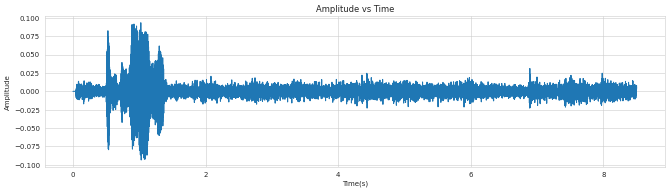

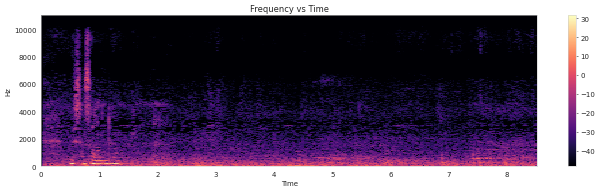

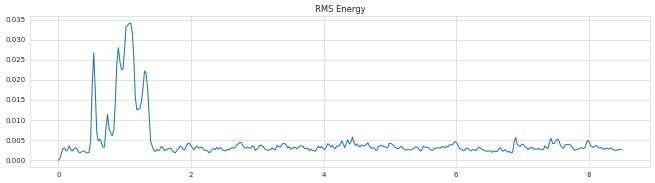

In [130]:
file_no_1=372 # sample file - indoor,	westend,	national
x_out, _ = load_audio(file_no_1, display_audio=True)
visualise_audio(x_out, fs)

/content/drive/MyDrive/Data/MLEndLS/MLEndLS/0400.wav : audio signal has 166478 samples


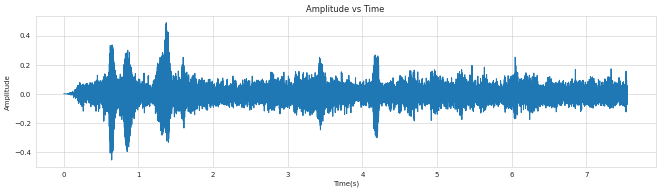

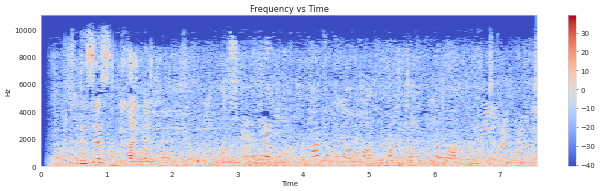

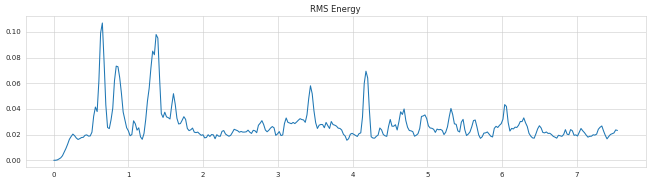

In [131]:
file_no_2=400 # sample file number - outdoor,	campus,	library
x_in, fs = load_audio(file_no_2, display_audio=True)
visualise_audio(x_in, fs)

In [53]:
pp_audio_class = X_train[['voiced_fr', 'intro_power', 'intro_pitch_mean', 
                           'power', 'tempo', 'zcr_mean', 'chroma_mean_1', 
                           'mfcc_mean_1', 'd_mfcc_mean_1', 'd2_mfcc_mean_1' ]]
pp_audio_class['area'] = y_train['area']
pp_audio_class.head()

<ipython-input-53-15ca13f0a986>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pp_audio_class['area'] = y_train['area']


,voiced_fr,intro_power,intro_pitch_mean,power,tempo,zcr_mean,chroma_mean_1,mfcc_mean_1,d_mfcc_mean_1,d2_mfcc_mean_1,area
file_id,,,,,,,,,,,
0372.wav,0.190736,0.014941,239.999223,0.000028,123.046875,0.031338,0.589783,-494.237120,-0.038117,0.027293,westend
0400.wav,0.128834,0.142621,233.259383,0.001814,123.046875,0.088441,0.459021,-192.256930,0.040624,0.108710,campus
0725.wav,0.839394,0.101173,80.564814,0.003553,123.046875,0.064631,0.785070,-181.897890,-0.119843,0.066285,westend
2207.wav,0.034810,0.220427,225.794159,0.004999,123.046875,0.310096,0.642938,-83.812164,0.152844,-0.020962,campus
2339.wav,0.970238,0.050465,82.491321,0.002871,129.199219,0.032515,0.489309,-262.804260,-0.337258,0.099034,westend


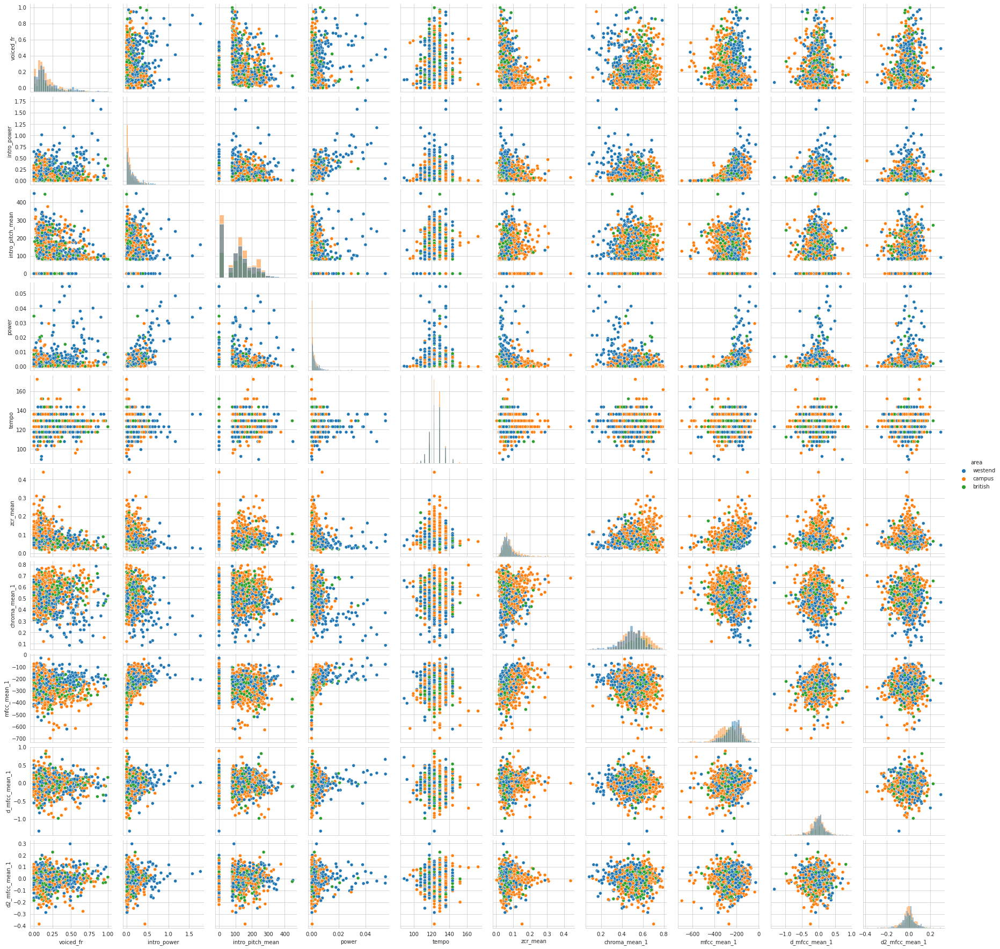

In [54]:
# Scatter plot of features 
sns.set_style("whitegrid");
sns.pairplot(pp_audio_class, hue='area', diag_kind="hist");
plt.show()

## 7.5 Feature Selection

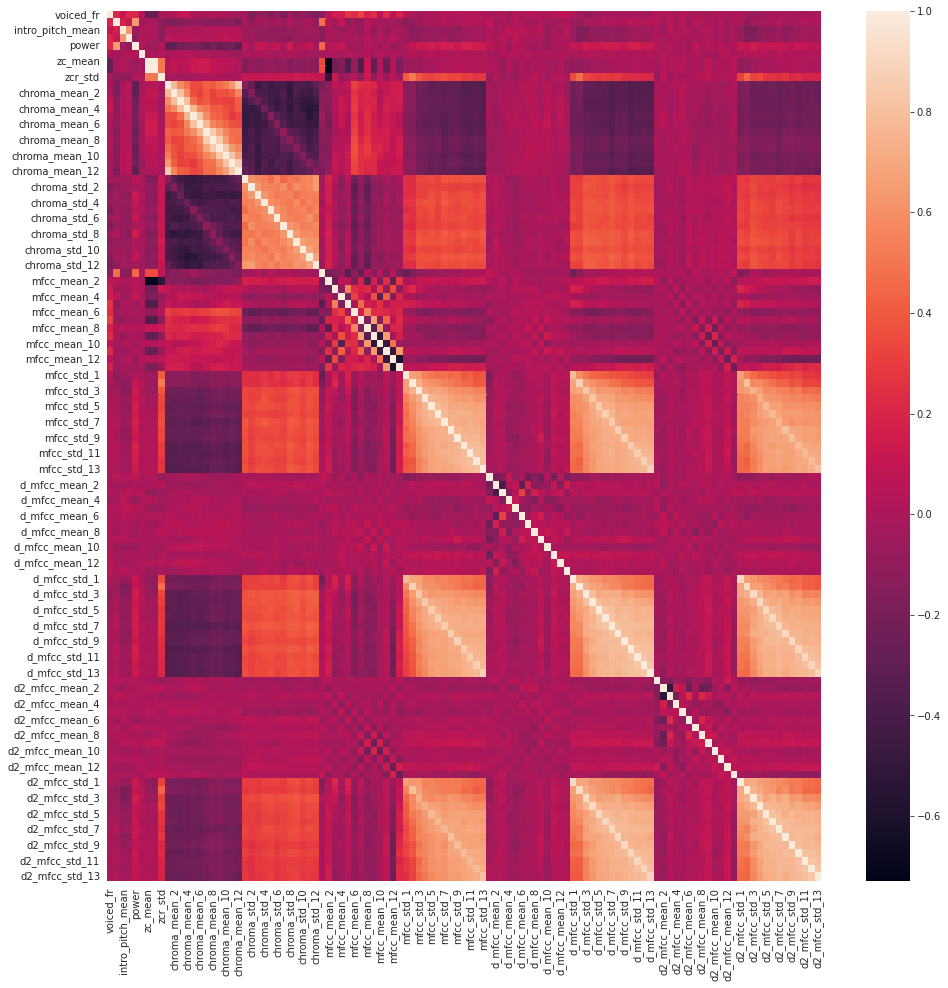

In [55]:
# Correlation heatmap of features
X_corr = X_train.corr()
plt.figure(figsize=(16,16))
sns.heatmap(X_corr)
plt.show()

In [56]:
# Identifying closely related features
corr_features = [] # using set so that there are no duplicates

for i in range(len(X_corr.columns)):
    for j in range(i):
        if (abs(X_corr.iloc[i, j]) >= 0.80): 
            colname = X_corr.columns[i]
            print(X_corr.columns[i], X_corr.columns[j], X_corr.iloc[i, j] )
            if colname not in corr_features:
              corr_features.append(colname) 

print(corr_features)
print(len(corr_features))

zcr_mean zc_mean 0.9999940947350238
chroma_mean_3 chroma_mean_2 0.8018194892931677
chroma_mean_4 chroma_mean_3 0.8072906035263986
chroma_mean_6 chroma_mean_5 0.8119902733968871
chroma_mean_8 chroma_mean_7 0.8520815758628671
chroma_mean_9 chroma_mean_8 0.8522733557758944
chroma_mean_10 chroma_mean_9 0.8470016799674103
chroma_mean_11 chroma_mean_10 0.82506421715463
chroma_mean_12 chroma_mean_1 0.840699937848155
chroma_mean_12 chroma_mean_11 0.8532629075076251
d_mfcc_std_2 mfcc_std_2 0.8805132343962784
d_mfcc_std_3 mfcc_std_3 0.8389483072887253
d_mfcc_std_4 mfcc_std_4 0.8337227190859419
d_mfcc_std_5 mfcc_std_5 0.8567974695382616
d_mfcc_std_6 mfcc_std_6 0.8651088439442746
d_mfcc_std_6 d_mfcc_std_5 0.824166017423265
d_mfcc_std_7 mfcc_std_7 0.855943066424098
d_mfcc_std_7 d_mfcc_std_6 0.8180355089804958
d_mfcc_std_8 mfcc_std_8 0.8693177621826781
d_mfcc_std_8 d_mfcc_std_7 0.8074986338490602
d_mfcc_std_9 mfcc_std_9 0.8738774604777596
d_mfcc_std_10 mfcc_std_10 0.8587932216155193
d_mfcc_std_11 mf

Observations -
*  The two features with highest correlation are - `zcr_mean` and `zc_mean`
*  The `d_mfcc_std_*` and `d2_mfcc_std_*` values have high correlation with the `mfcc_std_*` and `d_mfcc_std_*` respectively
*  The `chroma_mean_*` values have a high correlation with each other, however the `chroma_std_*` is not listed and can be assumed to not have high correlation (> 0.8). Both the mean and the standard deviation are calculated to represent the chroma feature. Thus, we will be keeping the `chroma_mean_[1-12]`

The following features will be dropped due to high correlation - `zc_mean`, `d_mfcc_std_[2-13]` and `d2_mfcc_std_[2-13]` features. We are keeping `d_mfcc_std_1` and `d2_mfcc_std_1` to avoid overfitting to training set. 

In [57]:
corr_features_list = ['zcr_mean', 'd_mfcc_std_2', 
                      'd_mfcc_std_3', 'd_mfcc_std_4', 'd_mfcc_std_5', 
                      'd_mfcc_std_6', 'd_mfcc_std_7', 'd_mfcc_std_8', 
                      'd_mfcc_std_9', 'd_mfcc_std_10', 'd_mfcc_std_11', 
                      'd_mfcc_std_12', 'd_mfcc_std_13',  
                      'd2_mfcc_std_2', 'd2_mfcc_std_3', 'd2_mfcc_std_4', 
                      'd2_mfcc_std_5', 'd2_mfcc_std_6', 'd2_mfcc_std_7',
                      'd2_mfcc_std_8', 'd2_mfcc_std_9', 'd2_mfcc_std_10',
                      'd2_mfcc_std_11', 'd2_mfcc_std_12', 'd2_mfcc_std_13']

In [58]:
X_train.drop(labels=corr_features_list, axis=1, inplace=True)
print('Number of columns in train dataset:', len(X_train.columns))
X_test.drop(labels=corr_features_list, axis=1, inplace=True)
print('Number of columns in test dataset:', len(X_test.columns))

Number of columns in train dataset: 86
Number of columns in test dataset: 86


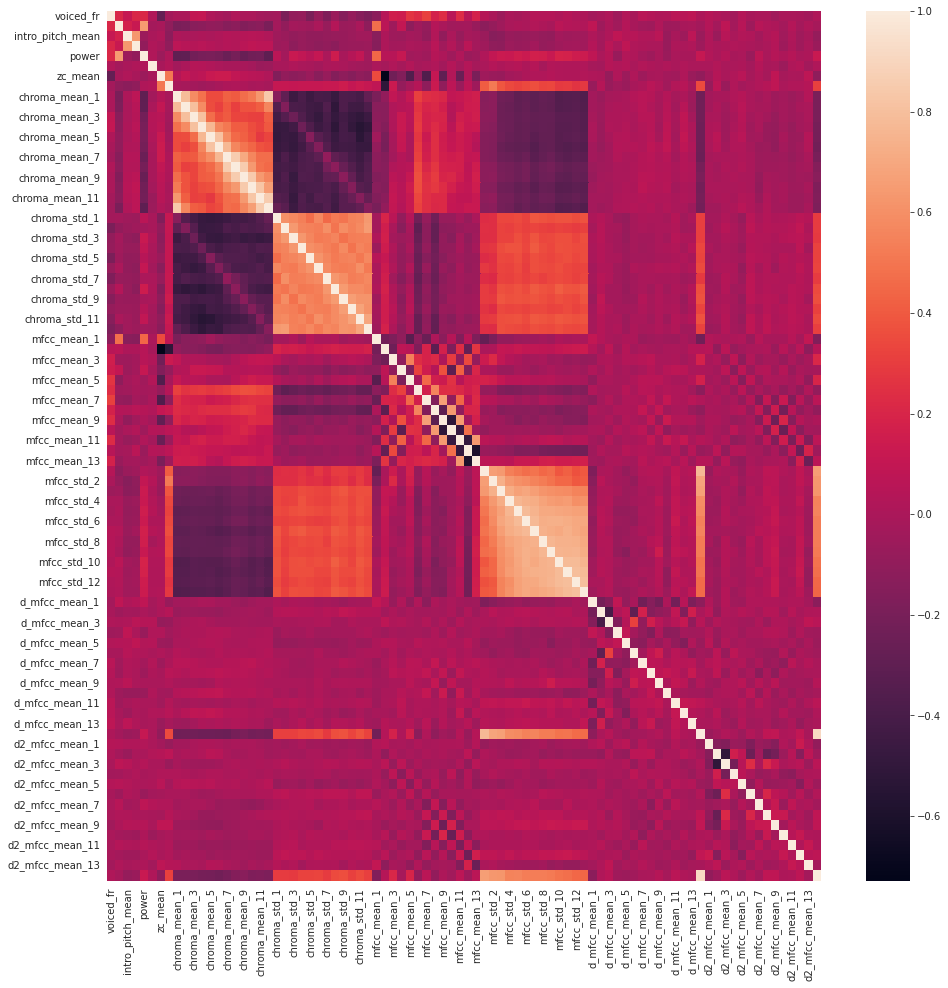

In [59]:
# New Correlation heatmap of features after dropping columns
X_corr = X_train.corr()
plt.figure(figsize=(16,16))
sns.heatmap(X_corr)
plt.show()

# 8 Results


## 8.1 Indoor/Outdoor Classifier

We will be using a Logistic regression classifier. The model has been evaluated against other models in the basic problem.

### 8.1.1 Training

In [71]:
final_model_in_out = LogisticRegression(C = 0.1, 
                                 class_weight = None,
                                 penalty = 'l1',
                                 random_state = 1,
                                 solver = 'liblinear')

final_model_pipeline_in_out = Pipeline([('scaler', StandardScaler()), ('model_training', final_model_in_out)])

final_model_pipeline_in_out.fit(X_train, y_train['in_out'])

Pipeline(steps=[('scaler', StandardScaler()),
                ('model_training',
                 LogisticRegression(C=0.1, penalty='l1', random_state=1,
                                    solver='liblinear'))])

### 8.1.2 Testing

In [70]:
y_test_pred_in_out = final_model_pipeline_in_out.predict(X_test)
classification_report(y_test['in_out'], y_test_pred_in_out, output_dict=True)

{'indoor': {'precision': 0.7783505154639175,
  'recall': 0.8031914893617021,
  'f1-score': 0.7905759162303665,
  'support': 188},
 'outdoor': {'precision': 0.8,
  'recall': 0.774869109947644,
  'f1-score': 0.7872340425531915,
  'support': 191},
 'accuracy': 0.7889182058047494,
 'macro avg': {'precision': 0.7891752577319588,
  'recall': 0.7890302996546731,
  'f1-score': 0.7889049793917791,
  'support': 379},
 'weighted avg': {'precision': 0.7892609417076952,
  'recall': 0.7889182058047494,
  'f1-score': 0.7888917529788086,
  'support': 379}}

We observe that the accuracy of the model on the test dataset is 78.9%, and lies within the estimated accuracy range - [75.3, 84.3]. Thus, the classifier is performing as expected.

## 8.2 Area Classifier

### 8.2.1 Model Selection

In [72]:
family_models

[RandomForestClassifier(), AdaBoostClassifier()]

In [74]:
cvFamilyOfModels(X_train, y_train['area'], family_models, k=5, eval_metric='accuracy', scaler=False)

{'RandomForestClassifier': [0.5938998535615151, 0.024786396725664767],
 'AdaBoostClassifier': [0.5423338360326099, 0.007015863249649689]}

As both the ensemble methods use decision trees we do not need to standardise the datset.

The Random Forest Classifier has an accuracy range [51.95, 66.83] and Adaptive Boosting Classifier has an accuracy range [52.13, 56.33]. While Random Forest Classifier has possibilities of achieving higher, Adaptive Boosting is more stable. We will explore both for hyperparameter tuning and further analysis.

## 8.2 Hyperparameter Tuning

### Random Forest Classifier

In [80]:
rand_for_params = {'n_estimators':[100, 500, 750], 
              'criterion': ['gini', 'entropy'],
              'max_features': ['sqrt', 'log2'],
              'class_weight': [None, 'balanced'],
              'random_state': [1]}

In [82]:
rand_for_results = tuningModel(X_train, y_train['area'], RandomForestClassifier(), 
                               rand_for_params, scaler=False)
display(rand_for_results)

,mean_fit_time,params,mean_test_score,std_test_score,rank_test_score
0,1.048664,"{'class_weight': None, 'criterion': 'gini', 'm...",0.593246,0.022382,23
1,6.946595,"{'class_weight': None, 'criterion': 'gini', 'm...",0.609123,0.018733,15
2,8.648736,"{'class_weight': None, 'criterion': 'gini', 'm...",0.609132,0.021199,14
3,0.681285,"{'class_weight': None, 'criterion': 'gini', 'm...",0.595900,0.025987,20
4,3.637388,"{'class_weight': None, 'criterion': 'gini', 'm...",0.614414,0.033185,10
5,5.132467,"{'class_weight': None, 'criterion': 'gini', 'm...",0.616403,0.030686,8
6,1.957905,"{'class_weight': None, 'criterion': 'entropy',...",0.617057,0.019110,7
7,10.930003,"{'class_weight': None, 'criterion': 'entropy',...",0.619044,0.029167,3
8,15.026086,"{'class_weight': None, 'criterion': 'entropy',...",0.621682,0.033926,1
9,1.722124,"{'class_weight': None, 'criterion': 'entropy',...",0.593244,0.021631,24


Although, the best result achieves an 62.17%, its standard deviation is 3.39% which is high, also the tme taken to train this model is pretty high. On the other hand, if we consider the 7th best model with an accuracy of 61.7% and 1.91% standard deviation, it is much more stable and takes lesser time to train.

In [99]:
rand_for_results.iloc[6]

mean_fit_time                                               1.957905
params             {'class_weight': None, 'criterion': 'entropy',...
mean_test_score                                             0.617057
std_test_score                                               0.01911
rank_test_score                                                    7
Name: 6, dtype: object

### Adaptive Boosting Classifier

In [100]:
ada_boost_params = {'n_estimators':[500, 750, 1000], 
                  'learning_rate': [0.001, 0.1, 1.0],
                  'random_state': [1]}

In [101]:
ada_boost_results = tuningModel(X_train, y_train['area'], AdaBoostClassifier(), 
                                ada_boost_params, scaler=False)
display(ada_boost_results)

,mean_fit_time,params,mean_test_score,std_test_score,rank_test_score
0,10.084863,"{'learning_rate': 0.001, 'n_estimators': 500, ...",0.485437,0.014098,7
1,13.612180,"{'learning_rate': 0.001, 'n_estimators': 750, ...",0.484119,0.011214,8
2,20.727191,"{'learning_rate': 0.001, 'n_estimators': 1000,...",0.484119,0.013186,8
3,8.682223,"{'learning_rate': 0.1, 'n_estimators': 500, 'r...",0.564153,0.018722,3
4,13.541297,"{'learning_rate': 0.1, 'n_estimators': 750, 'r...",0.571420,0.018583,1
5,18.424117,"{'learning_rate': 0.1, 'n_estimators': 1000, '...",0.564811,0.012931,2
6,10.647521,"{'learning_rate': 1.0, 'n_estimators': 500, 'r...",0.548305,0.018389,6
7,15.502493,"{'learning_rate': 1.0, 'n_estimators': 750, 'r...",0.554274,0.028568,5
8,20.524694,"{'learning_rate': 1.0, 'n_estimators': 1000, '...",0.562844,0.009024,4


In [102]:
ada_boost_results.iloc[4]

mean_fit_time                                              13.541297
params             {'learning_rate': 0.1, 'n_estimators': 750, 'r...
mean_test_score                                              0.57142
std_test_score                                              0.018583
rank_test_score                                                    1
Name: 4, dtype: object

Comparing the results of both methods, the **Random Forest Classifier** ranked 7th is better suited.

In [103]:
rand_for_results.iloc[6]['params']

{'class_weight': None,
 'criterion': 'entropy',
 'max_features': 'sqrt',
 'n_estimators': 100,
 'random_state': 1}

### 8.2.3 Training

In [104]:
final_model_area = RandomForestClassifier(class_weight = None,
                                 criterion = 'entropy',
                                 max_features = 'sqrt',
                                 random_state = 1,
                                 n_estimators = 100)

final_model_pipeline_area = Pipeline([('model_training', final_model_area)])

final_model_pipeline_area.fit(X_train, y_train['area'])

Pipeline(steps=[('model_training',
                 RandomForestClassifier(criterion='entropy',
                                        max_features='sqrt', random_state=1))])

## 8.4 Testing

In [105]:
y_test_pred_area = final_model_pipeline_area.predict(X_test)
classification_report(y_test['area'], y_test_pred_area, output_dict=True)

{'british': {'precision': 0.45,
  'recall': 0.21428571428571427,
  'f1-score': 0.29032258064516125,
  'support': 84},
 'campus': {'precision': 0.6108597285067874,
  'recall': 0.8181818181818182,
  'f1-score': 0.699481865284974,
  'support': 165},
 'westend': {'precision': 0.6016949152542372,
  'recall': 0.5461538461538461,
  'f1-score': 0.5725806451612901,
  'support': 130},
 'accuracy': 0.5910290237467019,
 'macro avg': {'precision': 0.5541848812536748,
  'recall': 0.5262071262071263,
  'f1-score': 0.5207950303638085,
  'support': 379},
 'weighted avg': {'precision': 0.5720638369041444,
  'recall': 0.5910290237467019,
  'f1-score': 0.5652693625783166,
  'support': 379}}

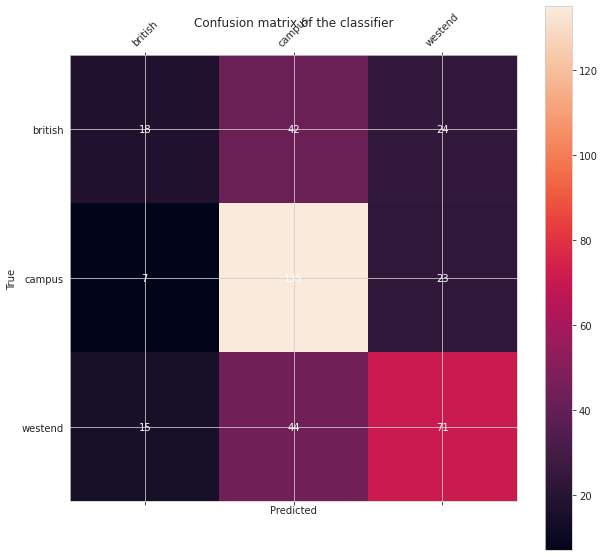

In [107]:
labels=['british', 'campus', 'westend']
cm = confusion_matrix(y_test['area'], y_test_pred_area, labels=labels)
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
cax = ax.matshow(cm)
plt.title('Confusion matrix of the classifier')
fig.colorbar(cax)
ax.set_xticks(np.arange(len(labels)))
ax.set_yticks(np.arange(len(labels)))
ax.set_xticklabels( labels, rotation=45)
ax.set_yticklabels( labels)

for i in range(len(cm)):
    for j in range(len(cm)):
        text = ax.text(j, i, cm[i, j],
                        ha="center", va="center", color="w")

plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

Observations:

*  The best predicted class with high precision is 'campus' and the worst is 'british', this could be attributed the class imbalance.
*  The overall accuracy is 59.1% and lies within the range accuracy estimated for the model [55.97, 67.43]. Thus, the model is performing as expected.

## 8.3 Spot Classifier

We will be taining this classifier along with the area and indoor/outdoor information. This is to help boost the prediction of the spot.

However during testing, we will employ the two previously built classifiers for area and indoor/outdoor to predict the respective attributes and pass them as input to the spot classifier.

### 8.3.1 Model Selection

In [110]:
family_models

[RandomForestClassifier(), AdaBoostClassifier()]

In [111]:
X_train.shape

(1512, 86)

In [112]:
X_train['in_out'] = y_train['in_out']
X_train['area'] = y_train['area']
X_train.shape

(1512, 88)

In [115]:
# Transforming area and in_out data to numeric type
X_train['in_out'] = LabelEncoder().fit_transform(X_train['in_out']) 
X_train['area'] = LabelEncoder().fit_transform(X_train['area']) 

In [116]:
cvFamilyOfModels(X_train, y_train['spot'], family_models, k=5, eval_metric='accuracy', scaler=False)

{'RandomForestClassifier': [0.6891329530304023, 0.015909087501789234],
 'AdaBoostClassifier': [0.27907678185037044, 0.02086533070335435]}

As both the ensemble methods use decision trees we do not need to standardise the datset. The Adaboost classifier is clearly not suited for our classification problem and the Random forest classifier performs better. This is probably because of the addition of metadata - in_out and area.

### 8.3.2 Hyperparameter Tuning

In [117]:
rand_for_params = {'n_estimators':[100, 500, 750], 
              'criterion': ['gini', 'entropy'],
              'max_features': ['sqrt', 'log2'],
              'class_weight': [None, 'balanced'],
              'random_state': [1]}

In [118]:
rand_for_results2 = tuningModel(X_train, y_train['spot'], RandomForestClassifier(), 
                               rand_for_params, scaler=False)
display(rand_for_results2)

,mean_fit_time,params,mean_test_score,std_test_score,rank_test_score
0,0.975512,"{'class_weight': None, 'criterion': 'gini', 'm...",0.681905,0.025368,12
1,4.801662,"{'class_weight': None, 'criterion': 'gini', 'm...",0.696453,0.021115,7
2,9.750297,"{'class_weight': None, 'criterion': 'gini', 'm...",0.701729,0.015080,4
3,0.955250,"{'class_weight': None, 'criterion': 'gini', 'm...",0.644170,0.022619,22
4,5.103731,"{'class_weight': None, 'criterion': 'gini', 'm...",0.677261,0.018809,16
5,6.347975,"{'class_weight': None, 'criterion': 'gini', 'm...",0.679892,0.011592,15
6,4.503406,"{'class_weight': None, 'criterion': 'entropy',...",0.684523,0.015159,11
7,22.476517,"{'class_weight': None, 'criterion': 'entropy',...",0.694459,0.018855,8
8,33.063673,"{'class_weight': None, 'criterion': 'entropy',...",0.697097,0.016403,6
9,2.685968,"{'class_weight': None, 'criterion': 'entropy',...",0.638240,0.020207,23


We will be selecting the best model as our final model.

In [120]:
rand_for_results2.iloc[19]['params']

{'class_weight': 'balanced',
 'criterion': 'entropy',
 'max_features': 'sqrt',
 'n_estimators': 500,
 'random_state': 1}

### 8.3.3 Training

In [121]:
final_model_spot = RandomForestClassifier(class_weight = 'balanced',
                                 criterion = 'entropy',
                                 max_features = 'sqrt',
                                 random_state = 1,
                                 n_estimators = 500)

final_model_pipeline_spot = Pipeline([('model_training', final_model_spot)])

final_model_pipeline_spot.fit(X_train, y_train['spot'])

Pipeline(steps=[('model_training',
                 RandomForestClassifier(class_weight='balanced',
                                        criterion='entropy',
                                        max_features='sqrt', n_estimators=500,
                                        random_state=1))])

### 8.4 Final Testing

This is the final testing phase, where we combine the machine learning models created and test in the scenario where we only have the audio and no metadata to provide the application.

In [122]:
X_test['in_out'] = y_test_pred_in_out # predicted indoor and outdoor values
X_test['area'] = y_test_pred_area # predicted area values

# Transforming area and in_out data to numeric type
X_test['in_out'] = LabelEncoder().fit_transform(X_test['in_out']) 
X_test['area'] = LabelEncoder().fit_transform(X_test['area']) 

In [123]:
X_test.shape

(379, 88)

In [127]:
y_test_pred_spot = final_model_pipeline_spot.predict(X_test)
classification_report(y_test['spot'], y_test_pred_spot, output_dict=True)

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'canal': {'precision': 0.45,
  'recall': 0.47368421052631576,
  'f1-score': 0.46153846153846156,
  'support': 19},
 'charing': {'precision': 0.2916666666666667,
  'recall': 0.3333333333333333,
  'f1-score': 0.3111111111111111,
  'support': 21},
 'curve': {'precision': 0.38461538461538464,
  'recall': 0.3225806451612903,
  'f1-score': 0.3508771929824561,
  'support': 31},
 'forecourt': {'precision': 0.0,
  'recall': 0.0,
  'f1-score': 0.0,
  'support': 24},
 'greatcourt': {'precision': 0.5,
  'recall': 0.5,
  'f1-score': 0.5,
  'support': 18},
 'ground': {'precision': 0.6785714285714286,
  'recall': 0.7307692307692307,
  'f1-score': 0.7037037037037038,
  'support': 26},
 'leicester': {'precision': 0.5384615384615384,
  'recall': 0.3181818181818182,
  'f1-score': 0.39999999999999997,
  'support': 22},
 'library': {'precision': 0.3076923076923077,
  'recall': 0.46153846153846156,
  'f1-score': 0.3692307692307692,
  'support': 26},
 'market': {'precision': 0.27586206896551724,
  'recall':

# 9 Conclusions

The accuracy of this model is 40.37% in the worst case scenario where the user has no information on whether the caller is indoor/outdoor and is unable to locate the area. 

This result is far improved from random guess which in this case would be 1/17 locations, that is 5.8%

## Scope for mprovements

*  If we have more data we can, always train better models
*  Exploring unsupervised learning methods like clustering of  area audio clips, could help model the data better for areas with lesser samples.
*  Suggesting the helpline staff to prioritise asking questions about area and indoor/outdoor location when possible, to use as input to the algorithm and help boost correctness of prediction.